# Setup

Make sure that the working directory is correct.

In [1]:
import os

print(os.getcwd())
#os.chdir('/home/ferdi/nonlinear_irm/code')
#print(f"Current working dir: {os.getcwd()}")
#
#if not os.path.exists('./checkpoints'):
#    os.makedirs('./checkpoints')

/home/ferdi/inVAE


In [17]:
%load_ext autoreload
%autoreload 2
import os

import scanpy as sc

import matplotlib.pyplot as plt
import time
import numpy as np
import torch
import pandas as pd

from general_models import FinVAE, NFinVAE
#import scvi
import warnings
warnings.filterwarnings('ignore')

sc.set_figure_params(dpi=200,figsize=(6,4),fontsize=10,frameon=False)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Test General inVAE

In [3]:
adata = sc.read(f'./data/multiome_gex_processed_training.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 22463 × 13431
    obs: 'n_genes_by_counts', 'pct_counts_mt', 'n_counts', 'n_genes', 'size_factors', 'phase', 'cell_type', 'pseudotime_order_GEX', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'dataset_id', 'organism'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts', 'log_norm'

In [5]:
# For normal decoder distribution
#sc.pp.scale(adata, layer='counts', zero_center=True, copy=False)

In [6]:
# hard-coded encoders for testing
#encoders = {
#    'obs': {
#        'cell_type': lambda c: encoder_cell_type.transform(c.to_numpy()[:, None]),
#        'batch': lambda b: encoder_batch.transform(b.to_numpy()[:, None])
#    }
#}

In [7]:
# Select highly variable genes
sc.pp.highly_variable_genes(adata, layer='log_norm', n_top_genes=2000)

In [8]:
adata.obs['batch'].cat.categories

Index(['s1d1', 's1d2', 's2d1', 's2d4', 's3d6'], dtype='object')

In [9]:
# First extract site and donor information from batch: format 'sXdX'

# site:
adata.obs['site'] = [s[1] for s in adata.obs['batch']]

# donor:
adata.obs['donor'] = [s[3] for s in adata.obs['batch']]

In [10]:
# Split data into train, val and test sets (with batch names)

train_batch_names = ['s1d1', 's1d2', 's2d1']
val_batch_names = ['s2d4']
test_batch_names = ['s3d6']

adata_train = adata[
    adata.obs.batch.isin(train_batch_names), 
    adata.var.highly_variable
].copy()

adata_val = adata[
    adata.obs.batch.isin(val_batch_names),
    adata.var.highly_variable
].copy()

adata_test = adata[
    adata.obs.batch.isin(test_batch_names), 
    adata.var.highly_variable
].copy()

In [11]:
# Define covariates for the invariant and spurious prior in the following way/structure

# cat = categorical, cont = continuous

# Covariates for the invariant prior
inv_covar_keys = {
    'cont': [],
    'cat': ['cell_type', 'donor']
}

# Covariates for the spurious prior
spur_covar_keys = {
    'cont': [],
    'cat': ['site']
}

## Factorized invariant VAE

In [12]:
np.load('./checkpoints/FinVAE/1689586514_3_hyperparameters_random_spur_dim_elbo_sample.npy', allow_pickle=True).tolist()

{'layer': 'counts',
 'batch_key': 'batch',
 'label_key': 'cell_type',
 'inv_covar_keys': {'cont': [], 'cat': ['cell_type', 'donor']},
 'spur_covar_keys': {'cont': [], 'cat': ['site']},
 'latent_dim': 30,
 'latent_dim_spur': 5,
 'n_layers': 4,
 'hidden_dim': 512,
 'activation': 'lrelu',
 'device': 'cuda',
 'fix_mean_spur_prior': True,
 'fix_var_spur_prior': False,
 'decoder_dist': 'nb',
 'batch_norm': True,
 'batch_size': 256,
 'elbo_version': 'sample'}

In [13]:
# If we want to use the Factorized inVAE: FinVAE

model = FinVAE(
    adata = adata_train,
    layer = 'counts',
    batch_key = 'batch',
    label_key = 'cell_type',
    inv_covar_keys = inv_covar_keys,
    spur_covar_keys = spur_covar_keys,
    latent_dim = 30, 
    latent_dim_spur = 5,
    n_layers = 4, 
    hidden_dim = 512,
    activation = 'lrelu', 
    slope = 0.1, # only needed when activation is Leaky ReLU ('lrelu')
    device = 'cpu',
    normalize_constant = 1.0, 
    fix_mean_prior = True,
    fix_var_prior = False,
    decoder_dist = 'nb',
    batch_norm = True,
    kl_rate = 1.0,
    batch_size = 256,
    elbo_version = 'sample',
)

Data loading done!


In [14]:
model.module.load_state_dict(torch.load('./checkpoints/FinVAE/1689586514_3_end_of_training_random_spur_dim_elbo_sample.pt', map_location=torch.device('cpu')))

<All keys matched successfully>

In [18]:
#model.load('./checkpoints/FinVAE/1689586514_3_end_of_training_random_spur_dim_elbo_sample.pt')

In [ ]:
model.train(
    n_epochs=500, 
    lr_train = 0.00049534457952372, #?
    weight_decay = 6.63927699026317e-06, #?
    log_dir = './test_invae/nf_invae',
    log_freq = 25, # in iterations
    print_every_n_epochs = 10
)

In [15]:
latent = model.get_latent_representation(adata_train, type='inv')
latent.shape

Calculating latent representation of passed adata by trying to transfer setup from the adata the model was trained on!


(15496, 25)

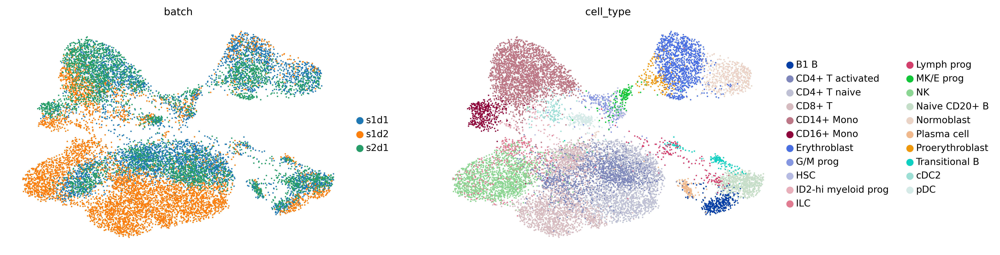

In [18]:
adata_train.obsm['X_FinVAE'] = latent

sc.pp.neighbors(adata_train, use_rep='X_FinVAE')
sc.tl.umap(adata_train)

sc.pl.umap(adata_train, color=['batch', 'cell_type'])

Calculating latent representation of passed adata by trying to transfer setup from the adata the model was trained on!


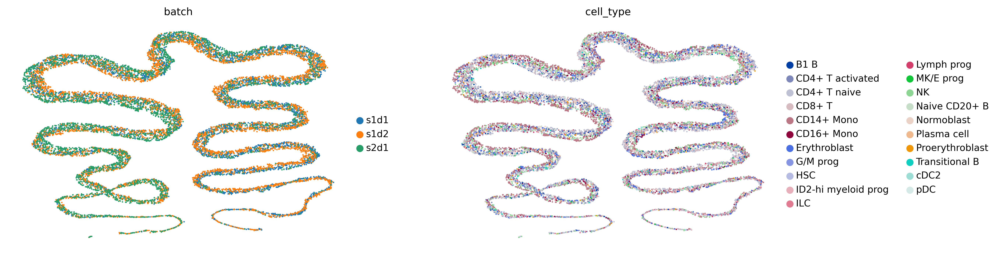

In [19]:
adata_train.obsm['X_FinVAE_spur'] = model.get_latent_representation(adata_train, type='spur')

sc.pp.neighbors(adata_train, use_rep='X_FinVAE_spur')
sc.tl.umap(adata_train)

sc.pl.umap(adata_train, color=['batch', 'cell_type'])

## Non-Factorized invariant VAE

In [21]:
np.load('./checkpoints/NFinVAE/1689336028_2_hyperparameters_random_spur_dim.npy', allow_pickle=True).tolist()

{'layer': 'counts',
 'batch_key': 'batch',
 'label_key': 'cell_type',
 'inv_covar_keys': {'cont': [], 'cat': ['cell_type', 'donor']},
 'spur_covar_keys': {'cont': [], 'cat': ['site']},
 'latent_dim': 30,
 'latent_dim_spur': 1,
 'n_layers': 4,
 'hidden_dim': 256,
 'activation': 'lrelu',
 'device': 'cuda',
 'fix_mean_spur_prior': True,
 'fix_var_spur_prior': False,
 'decoder_dist': 'nb',
 'batch_norm': True,
 'batch_size': 256,
 'reg_sm': 0.0,
 'output_dim_prior_nn': 40,
 'hidden_dim_prior': 80,
 'n_layers_prior': 3}

In [22]:
model = NFinVAE(
    adata = adata_train,
    layer = 'counts',
    batch_key = 'batch',
    label_key = 'cell_type',
    inv_covar_keys = inv_covar_keys,
    spur_covar_keys = spur_covar_keys,
    latent_dim = 30, 
    latent_dim_spur = 1,
    n_layers = 4, 
    hidden_dim = 256,
    activation = 'lrelu', 
    slope = 0.1, # only needed when activation is Leaky ReLU ('lrelu')
    device = 'cpu',
    normalize_constant = 1.0, 
    fix_mean_spur_prior = True,
    fix_var_spur_prior = False,
    decoder_dist = 'nb',
    batch_norm = True,
    batch_size = 256,
    reg_sm = 0.0,
    output_dim_prior_nn = 40,
    hidden_dim_prior = 80,
    n_layers_prior = 3,
)

Data loading done!


In [23]:
model.module.load_state_dict(torch.load('./checkpoints/NFinVAE/1689336028_2_end_of_training_random_spur_dim.pt', map_location=torch.device('cpu')))

<All keys matched successfully>

In [14]:
model.train(
    n_epochs=100, 
    lr_train = 0.00049534457952372, 
    weight_decay = 6.63927699026317e-06,
    log_dir = './test_invae/nf_invae',
    log_freq = 25, # in iterations
    print_every_n_epochs = 10
)

Starting training of model:
	epoch 10/100 took 2.93s; loss: 471.60
	epoch 20/100 took 3.14s; loss: 415.58
	epoch 30/100 took 2.96s; loss: 391.11
	epoch 40/100 took 3.04s; loss: 386.45
	epoch 50/100 took 3.14s; loss: 379.78
	epoch 60/100 took 3.15s; loss: 374.96
	epoch 70/100 took 3.53s; loss: 371.50
	epoch 80/100 took 3.81s; loss: 368.95
	epoch 90/100 took 3.18s; loss: 366.22
	epoch 100/100 took 3.13s; loss: 367.25
Training done!


In [24]:
latent = model.get_latent_representation(adata_train, type='inv')

Calculating latent representation of passed adata by trying to transfer setup from the adata the model was trained on!


In [22]:
latent.shape

(15496, 9)

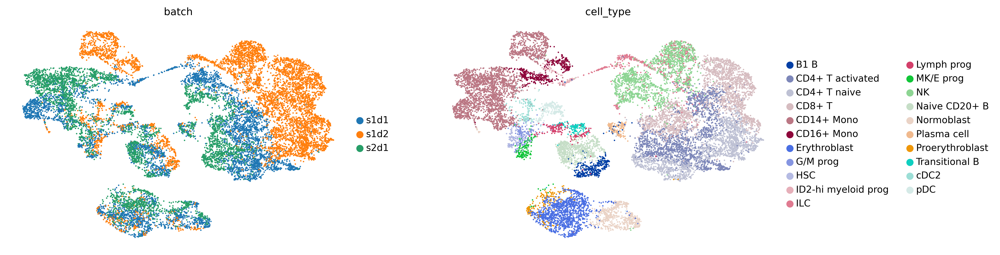

In [25]:
adata_train.obsm['X_NFinVAE'] = latent

sc.pp.neighbors(adata_train, use_rep='X_NFinVAE')
sc.tl.umap(adata_train)

sc.pl.umap(adata_train, color=['batch', 'cell_type'])

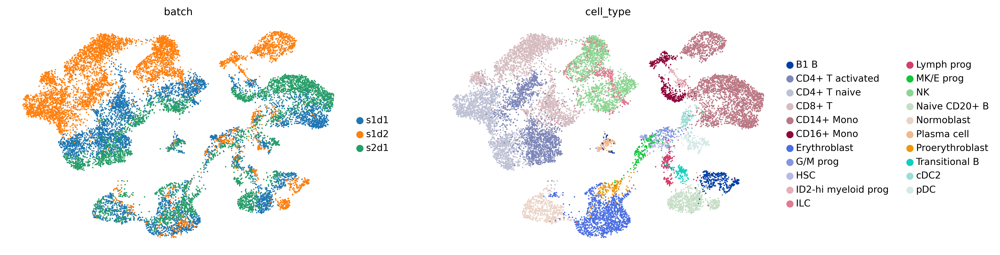

In [17]:
adata_train.obsm['X_NFinVAE'] = latent

sc.pp.neighbors(adata_train, use_rep='X_NFinVAE')
sc.tl.umap(adata_train)

sc.pl.umap(adata_train, color=['batch', 'cell_type'])

Using saved adata for latent representation!


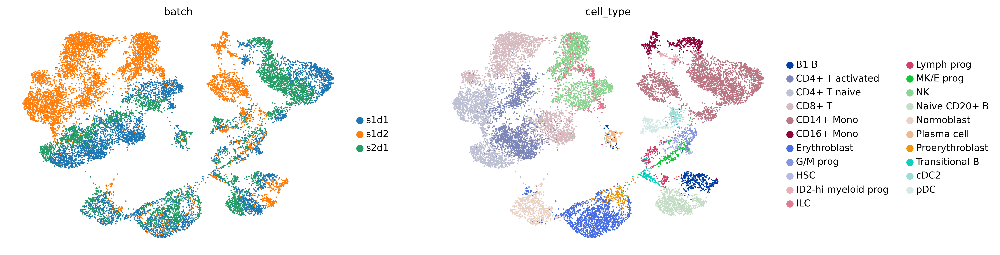

In [18]:
# Spurious latent representaion: here 1-dimensional -> plot full latent space (invariant + spurious representation)
full_latent = model.get_latent_representation(type='full')

adata_train.obsm['X_NFinVAE_full'] = full_latent

sc.pp.neighbors(adata_train, use_rep='X_NFinVAE_full')
sc.tl.umap(adata_train)

sc.pl.umap(adata_train, color=['batch', 'cell_type'])

# Saving and loading the model

In [19]:
# Save Hyperparameters in a dictionary

hp_dict = dict(
    layer = 'counts',
    batch_key = 'batch',
    label_key = 'cell_type',
    inv_covar_keys = inv_covar_keys,
    spur_covar_keys = spur_covar_keys,
    latent_dim = 10, 
    latent_dim_spur = 1,
    n_layers = 2, 
    hidden_dim = 154,
    activation = 'relu', 
    slope = 0.1, # only needed when activation is Leaky ReLU ('lrelu')
    device = 'cpu',
    normalize_constant = 1.0, 
    fix_mean_spur_prior = True,
    fix_var_spur_prior = False,
    decoder_dist = 'nb',
    batch_norm = True,
    batch_size = 256,
    reg_sm = 0.0,
    output_dim_prior_nn = 49,
    hidden_dim_prior = 56,
    n_layers_prior = 3,
)

# adata: can be saved separate if necessary

In [16]:
os.getcwd()

'/home/ferdi/nonlinear_irm/code'

In [20]:
# Save the pytroch module after training
model.save(save_dir='../checkpoints/test_general_invae/nfinvae_latent_10_checkpoint.pt')

Saving the pytorch module...
To load the model later you need to save the hyperparameters in a separate file/dictionary.


In [21]:
# Load the model
# one needs: adata, hyperparameters (in a dict) and the pytorch save directory
model = NFinVAE(adata_train, **hp_dict)

model.load('../checkpoints/test_general_invae/nfinvae_latent_10_checkpoint.pt')

Data loading done!
Loading the model from given checkpoint...


In [22]:
latent_loaded = model.get_latent_representation()

Using saved adata for latent representation!


In [23]:
# Check if the latent representation is the same before and after loaded:
np.array_equal(latent, latent_loaded)

True